#Youtube Video Title Generator

###Group A
###Abhishek Naithani - c0871411
###Karishma Shirsath - c0871245
###Tejaswi Kalla - c0852124
###Venkata Sai Charan Yerapasetty - c0863224

### **Table of contents**
1. [Libraries Used](#Libraries)  
2. [Converting the data to csv and loading it](#Convert)
3. [Overview of the dataset](#Overview)
4. [Exploratory data analysis](#EDA)
5. [Visualization](#Visual)
6. [Preprocessing the text](#Text)
7. [Modeling](#Model)
8. [Result for title generation](#Result)


## 1. Libraries Used <a class="anchor" id="Libraries"></a>

In [103]:
import pandas as pd
import ydata_profiling as pp

import json
import string
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
plt.style.use('ggplot')
import seaborn as sns
import plotly.graph_objs as go

import spacy
from plotly.offline import iplot
from spacy.lang.en import English
from spacy.lang.en.stop_words import STOP_WORDS
from tqdm import tqdm
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import make_pipeline
from lime.lime_text import LimeTextExplainer
from sklearn.decomposition import NMF, LatentDirichletAllocation, TruncatedSVD
from statistics import *

import pyLDAvis
from gensim.corpora.dictionary import Dictionary
from gensim.models.ldamodel import LdaModel
import pyLDAvis.gensim_models as gensimvis
import concurrent.futures
import time
pyLDAvis.enable_notebook()




from spacy.tokenizer import Tokenizer
from spacy.util import compile_prefix_regex, compile_infix_regex, compile_suffix_regex
import en_core_web_sm

from pylab import bone, pcolor, colorbar, plot, show, rcParams, savefig
import seaborn as sns
from tensorflow.keras.preprocessing.sequence import pad_sequences
from keras.layers import Embedding, LSTM, Dense, Dropout
from keras.preprocessing.text import Tokenizer
from keras.callbacks import EarlyStopping
from keras.models import Sequential
import keras.utils as ku
import nltk
from nltk.corpus import stopwords
from statistics import *
import concurrent.futures
import time

from pylab import bone, pcolor, colorbar, plot, show, rcParams, savefig

import tensorflow as tf
tf.random.set_seed(2)
from numpy.random import seed
seed(1)

import warnings
warnings.filterwarnings("ignore")


from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import make_scorer, roc_curve, roc_auc_score
from sklearn.metrics import precision_recall_fscore_support as score
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.multiclass import OneVsRestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC, LinearSVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB,MultinomialNB,BernoulliNB
from sklearn.tree import DecisionTreeRegressor
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import GridSearchCV

 ## 2. Converting the data to csv and loading it <a class="anchor" id="Convert"></a>

###Loading datasets for three countries 'US','Canada','UK' for video titles

In [2]:
#load all the datasets
df1 = pd.read_csv('USvideos.csv')
df2 = pd.read_csv('CAvideos.csv')
df3 = pd.read_csv('GBvideos.csv')

#load the datasets containing the category names
data1 = json.load(open('US_category_id.json'))
data2 = json.load(open('CA_category_id.json'))
data3 = json.load(open('GB_category_id.json'))

## 3. Overview of the dataset <a class="anchor" id="Overview"></a>

###US dataset

In [3]:
df1.head()

,video_id,trending_date,title,channel_title,category_id,publish_time,tags,views,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,video_error_or_removed,description
0,2kyS6SvSYSE,17.14.11,WE WANT TO TALK ABOUT OUR MARRIAGE,CaseyNeistat,22,2017-11-13T17:13:01.000Z,SHANtell martin,748374,57527,2966,15954,https://i.ytimg.com/vi/2kyS6SvSYSE/default.jpg,False,False,False,SHANTELL'S CHANNEL - https://www.youtube.com/s...
1,1ZAPwfrtAFY,17.14.11,The Trump Presidency: Last Week Tonight with J...,LastWeekTonight,24,2017-11-13T07:30:00.000Z,"last week tonight trump presidency|""last week ...",2418783,97185,6146,12703,https://i.ytimg.com/vi/1ZAPwfrtAFY/default.jpg,False,False,False,"One year after the presidential election, John..."
2,5qpjK5DgCt4,17.14.11,"Racist Superman | Rudy Mancuso, King Bach & Le...",Rudy Mancuso,23,2017-11-12T19:05:24.000Z,"racist superman|""rudy""|""mancuso""|""king""|""bach""...",3191434,146033,5339,8181,https://i.ytimg.com/vi/5qpjK5DgCt4/default.jpg,False,False,False,WATCH MY PREVIOUS VIDEO ▶ \n\nSUBSCRIBE ► http...
3,puqaWrEC7tY,17.14.11,Nickelback Lyrics: Real or Fake?,Good Mythical Morning,24,2017-11-13T11:00:04.000Z,"rhett and link|""gmm""|""good mythical morning""|""...",343168,10172,666,2146,https://i.ytimg.com/vi/puqaWrEC7tY/default.jpg,False,False,False,Today we find out if Link is a Nickelback amat...
4,d380meD0W0M,17.14.11,I Dare You: GOING BALD!?,nigahiga,24,2017-11-12T18:01:41.000Z,"ryan|""higa""|""higatv""|""nigahiga""|""i dare you""|""...",2095731,132235,1989,17518,https://i.ytimg.com/vi/d380meD0W0M/default.jpg,False,False,False,I know it's been a while since we did this sho...


###Canada dataset

In [4]:
df2.head()

,video_id,trending_date,title,channel_title,category_id,publish_time,tags,views,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,video_error_or_removed,description
0,n1WpP7iowLc,17.14.11,Eminem - Walk On Water (Audio) ft. Beyoncé,EminemVEVO,10,2017-11-10T17:00:03.000Z,"Eminem|""Walk""|""On""|""Water""|""Aftermath/Shady/In...",17158579,787425,43420,125882,https://i.ytimg.com/vi/n1WpP7iowLc/default.jpg,False,False,False,Eminem's new track Walk on Water ft. Beyoncé i...
1,0dBIkQ4Mz1M,17.14.11,PLUSH - Bad Unboxing Fan Mail,iDubbbzTV,23,2017-11-13T17:00:00.000Z,"plush|""bad unboxing""|""unboxing""|""fan mail""|""id...",1014651,127794,1688,13030,https://i.ytimg.com/vi/0dBIkQ4Mz1M/default.jpg,False,False,False,STill got a lot of packages. Probably will las...
2,5qpjK5DgCt4,17.14.11,"Racist Superman | Rudy Mancuso, King Bach & Le...",Rudy Mancuso,23,2017-11-12T19:05:24.000Z,"racist superman|""rudy""|""mancuso""|""king""|""bach""...",3191434,146035,5339,8181,https://i.ytimg.com/vi/5qpjK5DgCt4/default.jpg,False,False,False,WATCH MY PREVIOUS VIDEO ▶ \n\nSUBSCRIBE ► http...
3,d380meD0W0M,17.14.11,I Dare You: GOING BALD!?,nigahiga,24,2017-11-12T18:01:41.000Z,"ryan|""higa""|""higatv""|""nigahiga""|""i dare you""|""...",2095828,132239,1989,17518,https://i.ytimg.com/vi/d380meD0W0M/default.jpg,False,False,False,I know it's been a while since we did this sho...
4,2Vv-BfVoq4g,17.14.11,Ed Sheeran - Perfect (Official Music Video),Ed Sheeran,10,2017-11-09T11:04:14.000Z,"edsheeran|""ed sheeran""|""acoustic""|""live""|""cove...",33523622,1634130,21082,85067,https://i.ytimg.com/vi/2Vv-BfVoq4g/default.jpg,False,False,False,🎧: https://ad.gt/yt-perfect\n💰: https://atlant...


###UK dataset

In [5]:
df3.head()

,video_id,trending_date,title,channel_title,category_id,publish_time,tags,views,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,video_error_or_removed,description
0,Jw1Y-zhQURU,17.14.11,John Lewis Christmas Ad 2017 - #MozTheMonster,John Lewis,26,2017-11-10T07:38:29.000Z,"christmas|""john lewis christmas""|""john lewis""|...",7224515,55681,10247,9479,https://i.ytimg.com/vi/Jw1Y-zhQURU/default.jpg,False,False,False,Click here to continue the story and make your...
1,3s1rvMFUweQ,17.14.11,Taylor Swift: …Ready for It? (Live) - SNL,Saturday Night Live,24,2017-11-12T06:24:44.000Z,"SNL|""Saturday Night Live""|""SNL Season 43""|""Epi...",1053632,25561,2294,2757,https://i.ytimg.com/vi/3s1rvMFUweQ/default.jpg,False,False,False,Musical guest Taylor Swift performs …Ready for...
2,n1WpP7iowLc,17.14.11,Eminem - Walk On Water (Audio) ft. Beyoncé,EminemVEVO,10,2017-11-10T17:00:03.000Z,"Eminem|""Walk""|""On""|""Water""|""Aftermath/Shady/In...",17158579,787420,43420,125882,https://i.ytimg.com/vi/n1WpP7iowLc/default.jpg,False,False,False,Eminem's new track Walk on Water ft. Beyoncé i...
3,PUTEiSjKwJU,17.14.11,Goals from Salford City vs Class of 92 and Fri...,Salford City Football Club,17,2017-11-13T02:30:38.000Z,"Salford City FC|""Salford City""|""Salford""|""Clas...",27833,193,12,37,https://i.ytimg.com/vi/PUTEiSjKwJU/default.jpg,False,False,False,Salford drew 4-4 against the Class of 92 and F...
4,rHwDegptbI4,17.14.11,Dashcam captures truck's near miss with child ...,Cute Girl Videos,25,2017-11-13T01:45:13.000Z,[none],9815,30,2,30,https://i.ytimg.com/vi/rHwDegptbI4/default.jpg,False,False,False,Dashcam captures truck's near miss with child ...


###Combining all three country's data set into single data set

In [6]:
df = pd.concat([df1, df2, df3], ignore_index=True)


## 4. EDA <a class="anchor" id="EDA"></a>

In [7]:
df

,video_id,trending_date,title,channel_title,category_id,publish_time,tags,views,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,video_error_or_removed,description
0,2kyS6SvSYSE,17.14.11,WE WANT TO TALK ABOUT OUR MARRIAGE,CaseyNeistat,22,2017-11-13T17:13:01.000Z,SHANtell martin,748374,57527,2966,15954,https://i.ytimg.com/vi/2kyS6SvSYSE/default.jpg,False,False,False,SHANTELL'S CHANNEL - https://www.youtube.com/s...
1,1ZAPwfrtAFY,17.14.11,The Trump Presidency: Last Week Tonight with J...,LastWeekTonight,24,2017-11-13T07:30:00.000Z,"last week tonight trump presidency|""last week ...",2418783,97185,6146,12703,https://i.ytimg.com/vi/1ZAPwfrtAFY/default.jpg,False,False,False,"One year after the presidential election, John..."
2,5qpjK5DgCt4,17.14.11,"Racist Superman | Rudy Mancuso, King Bach & Le...",Rudy Mancuso,23,2017-11-12T19:05:24.000Z,"racist superman|""rudy""|""mancuso""|""king""|""bach""...",3191434,146033,5339,8181,https://i.ytimg.com/vi/5qpjK5DgCt4/default.jpg,False,False,False,WATCH MY PREVIOUS VIDEO ▶ \n\nSUBSCRIBE ► http...
3,puqaWrEC7tY,17.14.11,Nickelback Lyrics: Real or Fake?,Good Mythical Morning,24,2017-11-13T11:00:04.000Z,"rhett and link|""gmm""|""good mythical morning""|""...",343168,10172,666,2146,https://i.ytimg.com/vi/puqaWrEC7tY/default.jpg,False,False,False,Today we find out if Link is a Nickelback amat...
4,d380meD0W0M,17.14.11,I Dare You: GOING BALD!?,nigahiga,24,2017-11-12T18:01:41.000Z,"ryan|""higa""|""higatv""|""nigahiga""|""i dare you""|""...",2095731,132235,1989,17518,https://i.ytimg.com/vi/d380meD0W0M/default.jpg,False,False,False,I know it's been a while since we did this sho...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
120741,l884wKofd54,18.14.06,Enrique Iglesias - MOVE TO MIAMI (Official Vid...,EnriqueIglesiasVEVO,10,2018-05-09T07:00:01.000Z,"Enrique Iglesias feat. Pitbull|""MOVE TO MIAMI""...",25066952,268088,12783,9933,https://i.ytimg.com/vi/l884wKofd54/default.jpg,False,False,False,NEW SONG - MOVE TO MIAMI feat. Pitbull (Click ...
120742,IP8k2xkhOdI,18.14.06,Jacob Sartorius - Up With It (Official Music V...,Jacob Sartorius,10,2018-05-11T17:09:16.000Z,"jacob sartorius|""jacob""|""up with it""|""jacob sa...",1492219,61998,13781,24330,https://i.ytimg.com/vi/IP8k2xkhOdI/default.jpg,False,False,False,THE OFFICIAL UP WITH IT MUSIC VIDEO!Get my new...
120743,Il-an3K9pjg,18.14.06,Anne-Marie - 2002 [Official Video],Anne-Marie,10,2018-05-08T11:05:08.000Z,"anne|""marie""|""anne-marie""|""2002""|""two thousand...",29641412,394830,8892,19988,https://i.ytimg.com/vi/Il-an3K9pjg/default.jpg,False,False,False,Get 2002 by Anne-Marie HERE ▶ http://ad.gt/200...
120744,-DRsfNObKIQ,18.14.06,Eleni Foureira - Fuego - Cyprus - LIVE - First...,Eurovision Song Contest,24,2018-05-08T20:32:32.000Z,"Eurovision Song Contest|""2018""|""Lisbon""|""Cypru...",14317515,151870,45875,26766,https://i.ytimg.com/vi/-DRsfNObKIQ/default.jpg,False,False,False,Eleni Foureira represented Cyprus at the first...


In [8]:
df.shape

(120746, 16)

In [9]:
df.video_id.value_counts()[:10]

video_id
8h--kFui1JA    70
VYOjWnS4cMY    69
vjSohj-Iclc    65
l884wKofd54    64
UUkn-enk2RU    64
zxwfDlhJIpw    64
5GHXEGz3PJg    63
CX11yw6YL1w    63
pFc6I0rgmgY    61
i5qOzqD9Rms    61
Name: count, dtype: int64

###Removing duplicate data

In [10]:
df.isnull().sum()

video_id                     0
trending_date                0
title                        0
channel_title                0
category_id                  0
publish_time                 0
tags                         0
views                        0
likes                        0
dislikes                     0
comment_count                0
thumbnail_link               0
comments_disabled            0
ratings_disabled             0
video_error_or_removed       0
description               2478
dtype: int64

In [11]:
df.duplicated(['video_id']).sum()

90428

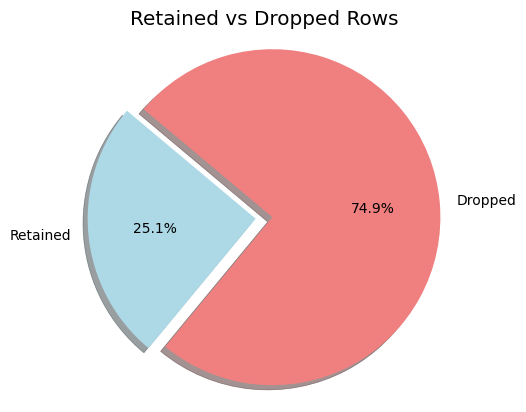

Retained Rows: 30318
Dropped Rows: 90428


In [12]:
df_no_duplicates = df.drop_duplicates(['video_id'], keep='first')
retained_count = df_no_duplicates.shape[0]
dropped_count = df.shape[0] - retained_count

# Plot a pie chart
labels = ['Retained', 'Dropped']
sizes = [retained_count, dropped_count]
colors = ['lightblue', 'lightcoral']
explode = (0.1, 0)  # explode 1st slice

plt.pie(sizes, explode=explode, labels=labels, colors=colors,
        autopct='%1.1f%%', shadow=True, startangle=140)
plt.axis('equal')
plt.title("Retained vs Dropped Rows")

plt.show()

# Print counts of retained and dropped rows
print("Retained Rows:", retained_count)
print("Dropped Rows:", dropped_count)

In [13]:
df= df_no_duplicates

In [14]:
df.video_id.value_counts()[:10]

video_id
2kyS6SvSYSE    1
8GOk8Ci3kn4    1
TkWmK-cplV4    1
kqzEjuAfOs4    1
pOBhd7437sY    1
jxfNztGWiZ4    1
JrkNAXOq7-4    1
ycunI1DJ5xI    1
YWUPjVxTRIM    1
NrnK1f6THj4    1
Name: count, dtype: int64

### Dataset Shape after removing duplicate values

In [15]:
df.shape

(30318, 16)

In [16]:
df.category_id.head()

0    22
1    24
2    23
3    24
4    24
Name: category_id, dtype: int64

In [17]:
def category_name(path):
    with open(path) as json_file:
        data = json.load(json_file)
    category_info_list=[]
    for row in data['items']:
        id_info=row['id']
        category_name=row['snippet']['title']
        categoty_info=(id_info ,category_name)
        category_info_list.append(categoty_info)
    return(dict(category_info_list))


###Getting Different cateories for video

In [18]:
category_name("CA_category_id.json")

{'1': 'Film & Animation',
 '2': 'Autos & Vehicles',
 '10': 'Music',
 '15': 'Pets & Animals',
 '17': 'Sports',
 '18': 'Short Movies',
 '19': 'Travel & Events',
 '20': 'Gaming',
 '21': 'Videoblogging',
 '22': 'People & Blogs',
 '23': 'Comedy',
 '24': 'Entertainment',
 '25': 'News & Politics',
 '26': 'Howto & Style',
 '27': 'Education',
 '28': 'Science & Technology',
 '30': 'Movies',
 '31': 'Anime/Animation',
 '32': 'Action/Adventure',
 '33': 'Classics',
 '34': 'Comedy',
 '35': 'Documentary',
 '36': 'Drama',
 '37': 'Family',
 '38': 'Foreign',
 '39': 'Horror',
 '40': 'Sci-Fi/Fantasy',
 '41': 'Thriller',
 '42': 'Shorts',
 '43': 'Shows',
 '44': 'Trailers'}

In [19]:
category_list=category_name("CA_category_id.json")
category_names=[]
for i in df.category_id:
    category_name=category_list.get(str(i))
    category_names.append(category_name)

df['category_names']=category_names


In [20]:
df['category_names'].head()

0    People & Blogs
1     Entertainment
2            Comedy
3     Entertainment
4     Entertainment
Name: category_names, dtype: object

In [21]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 30318 entries, 0 to 120717
Data columns (total 17 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   video_id                30318 non-null  object
 1   trending_date           30318 non-null  object
 2   title                   30318 non-null  object
 3   channel_title           30318 non-null  object
 4   category_id             30318 non-null  int64 
 5   publish_time            30318 non-null  object
 6   tags                    30318 non-null  object
 7   views                   30318 non-null  int64 
 8   likes                   30318 non-null  int64 
 9   dislikes                30318 non-null  int64 
 10  comment_count           30318 non-null  int64 
 11  thumbnail_link          30318 non-null  object
 12  comments_disabled       30318 non-null  bool  
 13  ratings_disabled        30318 non-null  bool  
 14  video_error_or_removed  30318 non-null  bool  
 15  descri

 ## 5. Visualization <a class="anchor" id="Visual"></a>

### Plotting pandas profiling report using columns - Views, Like, Dislike, Comment count

In [22]:
profile =pp.ProfileReport(df[['views','likes','dislikes','comment_count']])


In [23]:
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [24]:
profile.to_file("report.html")

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

###Finding Outlier Youtube Video
**The dataset already includes trending Youtube video. However,  we are taking a look at popular ones among trending videos. we will use number of view as the variable to define the popularity of video. In the analysis, a popular video means the number of view for the video is more than 1.5 interquartile ranges (IQRs) above the third quartile.**

In [25]:
Q1 = df.views.quantile(0.25)
Q3 = df.views.quantile(0.75)
IQR = Q3 - Q1
print(IQR)

popular_videos=df.loc[df.views > (Q3 + 1.5 * IQR)]

df['popular']=0
df.loc[df.views > (Q3 + 1.5 * IQR),'popular']=1

df['popular'].value_counts()

399092.75


popular
0    27416
1     2902
Name: count, dtype: int64

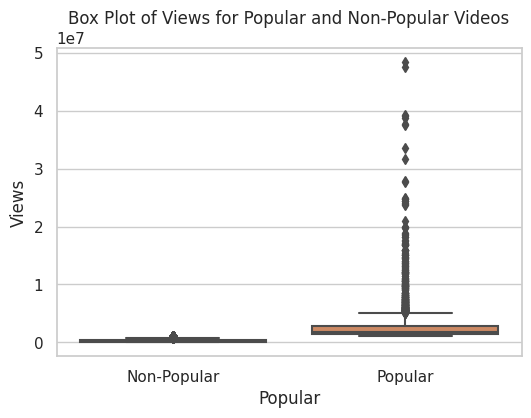

In [26]:
# Create a box plot for the 'views' column, grouped by the 'popular' column
sns.set(style="whitegrid")
plt.figure(figsize=(6, 4))
sns.boxplot(x='popular', y='views', data=df)
plt.title('Box Plot of Views for Popular and Non-Popular Videos')
plt.xlabel('Popular')
plt.ylabel('Views')
plt.xticks([0, 1], ['Non-Popular', 'Popular'])
plt.show()

###Make a variable that tells ratio of like and dislike

In [27]:
df['like_percentage']=(df['likes']/(df['likes']+df['dislikes'])*100)
#date column as datatime datatype
df["publish_time"] = pd.to_datetime(df["publish_time"])

###Plotting top 20 Channels by views

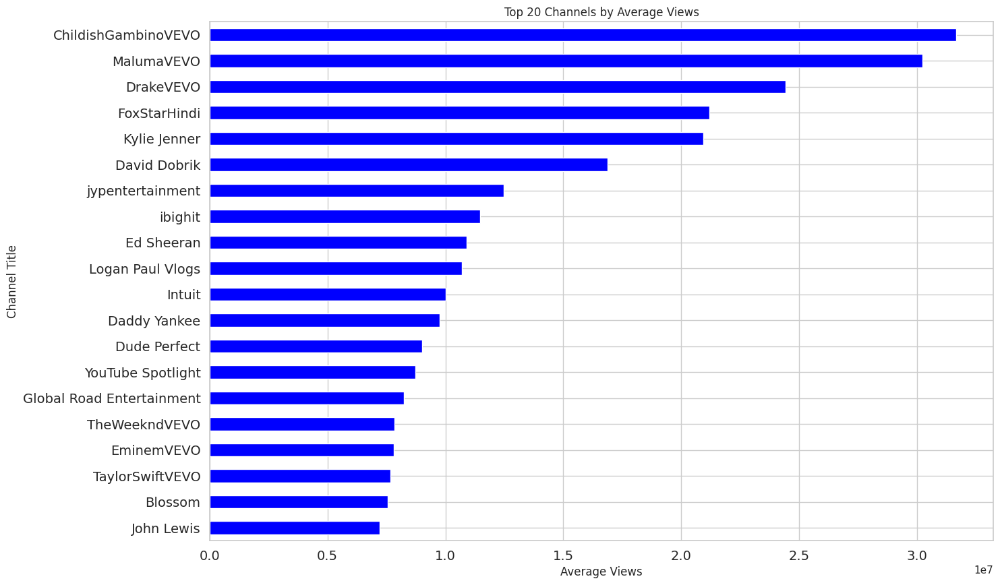

In [28]:
df1['views'] = pd.to_numeric(df['views'], errors='coerce')

# Group by 'channel_title', calculate mean views, and sort by views
top_channels = df1.groupby('channel_title')['views'].mean().sort_values(ascending=False)[:20]

# Plot the horizontal bar chart
fig, ax = plt.subplots(figsize=(15, 10))
top_channels.sort_values(ascending=True).plot(kind='barh', colormap='winter', fontsize=14, ax=ax)

# Customize plot labels and title
ax.set_xlabel('Average Views')
ax.set_ylabel('Channel Title')
ax.set_title('Top 20 Channels by Average Views')

plt.show()

### Among popular video, here are top 10 like percentage video. All of them are k-pop stars MV


<table><tr>
<td> <img src="https://i.ytimg.com/vi/PMEkmiQP5bg/default.jpg" alt="Drawing" style="width: 700px;"/> </td>
<td> <img src="https://i.ytimg.com/vi/v9ea5VDQfXg/default.jpg"  alt="Drawing" style="width: 700px;"/> </td>
<td> <img src="https://i.ytimg.com/vi/c5_LROaHGtw/default.jpg"  alt="Drawing" style="width: 700px;"/> </td>
<td> <img src="https://i.ytimg.com/vi/3-FXW0CW_8o/default.jpg"  alt="Drawing" style="width: 700px;"/> </td>
<td> <img src="https://i.ytimg.com/vi/-7tSTUR7FG0/default.jpg"  alt="Drawing" style="width: 700px;"/> </td>
<td> <img src="https://i.ytimg.com/vi/J41qe-TM1DY/default.jpg"  alt="Drawing" style="width: 700px;"/> </td>
<td> <img src="https://i.ytimg.com/vi/nQySbNGu4g0/default.jpg"  alt="Drawing" style="width: 700px;"/> </td>
<td> <img src="https://i.ytimg.com/vi/Q48VduIflPk/default.jpg"  alt="Drawing" style="width: 700px;"/> </td>
<td> <img src="https://i.ytimg.com/vi/floMqK_yHf8/default.jpg"  alt="Drawing" style="width: 700px;"/> </td>
<td> <img src="https://i.ytimg.com/vi/VM-g_bkFdzo/default.jpg"  alt="Drawing" style="width: 700px;"/> </td>
</tr></table>


In [29]:
df.loc[df.popular==1].sort_values(by=['like_percentage'], ascending=False)[:10]

,video_id,trending_date,title,channel_title,category_id,publish_time,tags,views,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,video_error_or_removed,description,category_names,popular,like_percentage
73164,PMEkmiQP5bg,18.02.05,G.C.F in Osaka,BANGTANTV,10,2018-04-30 13:03:49+00:00,"방탄소년단|""BTS""|""BANGTAN""|""HIPHOP""|""랩몬스터""|""RapMons...",2942269,688754,687,61516,https://i.ytimg.com/vi/PMEkmiQP5bg/default.jpg,False,False,False,BTS Official Homepage http://bts.ibighit.com\n...,Music,1,99.900354
95851,v9ea5VDQfXg,18.25.01,JONGHYUN 종현 '우린 봄이 오기 전에 (Before Our Spring)' MV,SMTOWN,10,2018-01-24 03:00:02+00:00,"JONGHYUN|""종현""|""샤이니""|""SHINee""|""우린 봄이 오기 전에""|""Be...",1498763,310738,332,26463,https://i.ytimg.com/vi/v9ea5VDQfXg/default.jpg,False,False,False,JONGHYUN's Poet | Artist has been released.\nL...,Music,1,99.893272
85075,c5_LROaHGtw,17.30.11,[EPISODE] BTS (방탄소년단) 'MIC Drop' MV Shooting,BANGTANTV,10,2017-11-29 10:00:03+00:00,"방탄소년단|""BTS""|""BANGTAN""|""HIPHOP""|""랩몬스터""|""RapMons...",1447420,245075,354,12157,https://i.ytimg.com/vi/c5_LROaHGtw/default.jpg,False,False,False,BTS Official Homepage http://bts.ibighit.com\n...,Music,1,99.855763
9210,Q48VduIflPk,17.30.12,[STATION] SMTOWN 'Dear My Family (Live Concert...,SMTOWN,10,2017-12-29 09:00:02+00:00,"SM STATION|""SMTOWN""|""Dear My Family""|""SM Enter...",1475878,277429,548,20109,https://i.ytimg.com/vi/Q48VduIflPk/default.jpg,False,False,False,SMTOWN's STATION track Dear My Family has been...,Music,1,99.802861
57272,3-FXW0CW_8o,18.05.02,[BANGTAN BOMB] V&Jungkook Singing at standby time,BANGTANTV,10,2018-02-04 06:00:07+00:00,"방탄소년단|""BTS""|""BANGTAN""|""HIPHOP""|""랩몬스터""|""RapMons...",1596081,345195,702,40251,https://i.ytimg.com/vi/3-FXW0CW_8o/default.jpg,False,False,False,BTS Official Homepage http://bts.ibighit.com\n...,Music,1,99.797049
102618,-7tSTUR7FG0,18.28.02,NCT U 엔시티 유 'BOSS' Dance Practice,SMTOWN,10,2018-02-27 12:00:00+00:00,"NCT|""NCT 2018""|""TAEYONG""|""JAEHYUN""|""JUNGWOO""|""...",1092530,152536,338,8272,https://i.ytimg.com/vi/-7tSTUR7FG0/default.jpg,False,False,False,NCT U BOSS MV has reached 10 million views!\nT...,Music,1,99.778903
13830,J41qe-TM1DY,18.24.01,JONGHYUN 종현 '빛이 나 (Shinin’)' MV,SMTOWN,10,2018-01-23 04:00:00+00:00,"JONGHYUN|""종현""|""SHINee""|""샤이니""|""빛이 나""|""Shinin'""|...",4285299,827151,1897,104986,https://i.ytimg.com/vi/J41qe-TM1DY/default.jpg,False,False,False,JONGHYUN's Poet | Artist has been released.\nL...,Music,1,99.771183
37355,nQySbNGu4g0,18.28.05,[CHOREOGRAPHY] BTS (방탄소년단) 'FAKE LOVE' Dance P...,BANGTANTV,10,2018-05-27 11:00:03+00:00,"방탄소년단|""BTS""|""BANGTAN""|""HIPHOP""|""랩몬스터""|""RapMons...",4196932,845029,1948,56047,https://i.ytimg.com/vi/nQySbNGu4g0/default.jpg,False,False,False,BTS Official Homepage http://bts.ibighit.comBT...,Music,1,99.770006
14623,floMqK_yHf8,18.28.01,[BANGTAN BOMB] 'MIC Drop' Special Stage (BTS f...,BANGTANTV,10,2018-01-27 05:00:00+00:00,"방탄소년단|""BTS""|""BANGTAN""|""HIPHOP""|""랩몬스터""|""RapMons...",1835185,342655,807,25545,https://i.ytimg.com/vi/floMqK_yHf8/default.jpg,False,False,False,BTS Official Homepage http://bts.ibighit.com\n...,Music,1,99.765040
110073,VM-g_bkFdzo,18.07.04,[STATION] TEN 텐 'New Heroes' MV,SMTOWN,10,2018-04-06 09:00:05+00:00,"NCT|""텐""|""TEN""|""SM STATION""|""슴스테""|""New Heroes""|...",1113267,206212,507,19119,https://i.ytimg.com/vi/VM-g_bkFdzo/default.jpg,False,False,False,"The 52nd STATION track, TEN's New Heroes has b...",Music,1,99.754740


### Among popular videos, here are top 10 dislike percentage video.

<table><tr>
<td> <img src="https://i.ytimg.com/vi/V5cOvyDpWfM/default.jpg" alt="Drawing" style="width: 700px;"/> </td>
<td> <img src="https://i.ytimg.com/vi/qu-biRtYEcU/default.jpg"  alt="Drawing" style="width: 700px;"/> </td>
<td> <img src="https://i.ytimg.com/vi/Aqx41JrNTSw/default.jpg"  alt="Drawing" style="width: 700px;"/> </td>
<td> <img src="https://i.ytimg.com/vi/C-rumHvmqCA/default.jpg"  alt="Drawing" style="width: 700px;"/> </td>
<td> <img src="https://i.ytimg.com/vi/ivYp5NMaUY4/default.jpg"  alt="Drawing" style="width: 700px;"/> </td>
<td> <img src="https://i.ytimg.com/vi/xZZyckBhCmY/default.jpg"  alt="Drawing" style="width: 700px;"/> </td>
<td> <img src="https://i.ytimg.com/vi/zhUmo88gzwg/default.jpg"  alt="Drawing" style="width: 700px;"/> </td>
<td> <img src="https://i.ytimg.com/vi/CMA2iF6RuXk/default.jpg"  alt="Drawing" style="width: 700px;"/> </td>
<td> <img src="https://i.ytimg.com/vi/wJJqGh2HLM8/default.jpg"  alt="Drawing" style="width: 700px;"/> </td>
<td> <img src="https://i.ytimg.com/vi/eT9eWtb7C4c/default.jpg"  alt="Drawing" style="width: 700px;"/> </td>
</tr></table>


In [30]:
df.loc[df.popular==1].sort_values(by=['like_percentage'], ascending=True)[:10]

,video_id,trending_date,title,channel_title,category_id,publish_time,tags,views,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,video_error_or_removed,description,category_names,popular,like_percentage
7116,LFhT6H6pRWg,17.19.12,PSA from Chairman of the FCC Ajit Pai,Daily Caller,22,2017-12-13 22:52:57+00:00,"thedc|""dc""|""washington dc""|""washington""|""the d...",1142585,9100,218841,28013,https://i.ytimg.com/vi/LFhT6H6pRWg/default.jpg,False,False,False,Ajit Pai has been at the heart of the net neut...,People & Blogs,1,3.992261
84236,qu-biRtYEcU,17.26.11,Volar - Jaime Ciero,paulitaale,10,2011-12-26 02:50:18+00:00,"Jaime Ciero|""compositor""|""cantautor Chileno Me...",1213682,757,3275,1495,https://i.ytimg.com/vi/qu-biRtYEcU/default.jpg,False,False,False,"Jaime Ciero, compositor, cantautor Chileno Me ...",Music,1,18.774802
60374,Aqx41JrNTSw,18.21.02,김보름 진심으로 사과드립니다..결국 눈물로 사죄 (기자회견 풀영상) / SBS / ...,SBS 뉴스,25,2018-02-20 09:33:31+00:00,"뉴스|""NEWS""|""news""|""SBS""|""sbs""|""SBS NEWS""|""SBS8N...",1337500,2200,8092,14673,https://i.ytimg.com/vi/Aqx41JrNTSw/default.jpg,False,False,False,스피드스케이팅 여자 팀추월 경기에서 불거진 팀워크 논란과 관련해 당사자인 김보름 선...,News & Politics,1,21.375826
19376,V5cOvyDpWfM,18.21.02,Fergie Performs The U.S. National Anthem / 201...,MLG Highlights,17,2018-02-19 01:37:11+00:00,"mlg highlights|""mlg""|""basketball""|""highlights""...",14647590,32892,117128,44404,https://i.ytimg.com/vi/V5cOvyDpWfM/default.jpg,False,False,False,🏀Fergie Performs The U.S. National Anthem / 20...,Sports,1,21.925077
16194,C-rumHvmqCA,18.05.02,T-Mobile | #LittleOnes | 2018 Big Game Ad,T-Mobile,24,2018-02-05 02:12:26+00:00,"best super bowl ads|""best superbowl ads""|""best...",1687984,1700,5735,0,https://i.ytimg.com/vi/C-rumHvmqCA/default.jpg,True,False,False,"Welcome to the world, little ones! In this big...",Entertainment,1,22.864829
65614,ivYp5NMaUY4,18.19.03,Выборы-2018. Подсчет голосов. Прямой эфир,Политика сегодня: Россия США Украина,25,2018-03-19 00:53:55+00:00,"соловьев|""владимир""|""политика россии""|""политик...",1524665,11331,37610,2971,https://i.ytimg.com/vi/ivYp5NMaUY4/default.jpg,False,False,False,ПОДПИСКА ЛУЧШЕ ДОНАТА - http://bit.ly/2nZJUXo\...,News & Politics,1,23.152367
50943,xZZyckBhCmY,18.03.01,REUPLOAD Logan Paul Vlogs We found a dead bo...,ShadeBlade02,23,2018-01-02 04:08:05+00:00,"Logan Paul|""Jake Paul""",2299882,9382,30072,5709,https://i.ytimg.com/vi/xZZyckBhCmY/default.jpg,False,False,False,just to show how shitty logan paul is.\nEDIT: ...,Comedy,1,23.779591
51246,zhUmo88gzwg,18.04.01,Logan Paul deleted Vlog video - Suicide forest...,Enima Videos,24,2018-01-02 23:57:52+00:00,"logan|""paul""|""logan paul""|""jake paul""|""pewdiep...",1231083,2699,8482,1006,https://i.ytimg.com/vi/zhUmo88gzwg/default.jpg,False,False,False,"Logan paul , big brother of Jake Paul ( owner ...",Entertainment,1,24.139165
19173,CMA2iF6RuXk,18.20.02,Fergie's national anthem draws criticism | ESPN,ESPN,17,2018-02-19 12:42:36+00:00,"espn|""espn live""|""fergie""|""national""|""anthem""|...",2762839,14362,37877,21507,https://i.ytimg.com/vi/CMA2iF6RuXk/default.jpg,False,False,False,The Black Eyed Peas singer Fergie provides a u...,Sports,1,27.492869
16198,wJJqGh2HLM8,18.05.02,Hope Detector | Hyundai NFL Super Bowl LII,HyundaiUSA,2,2018-02-04 23:31:40+00:00,"Hyundai|""Hyundai Super Bowl""|""Hyundai surprise...",1217201,243,600,105,https://i.ytimg.com/vi/wJJqGh2HLM8/default.jpg,False,False,False,What if metal detectors detected something mor...,Autos & Vehicles,1,28.825623


## 6. Preprocessing the text <a class="anchor" id="Text"></a>
###Closer look on Titles of Popular Videos using Spacy

In [31]:
punctuations = string.punctuation
stopwords = list(STOP_WORDS)
parser = spacy.load('en_core_web_sm')

def spacy_tokenizer(sentence):
    mytokens = parser(sentence)
    mytokens = [ word.lemma_.lower().strip() if word.lemma_ != "-PRON-" else word.lower_ for word in mytokens ]
    mytokens = [ word for word in mytokens if word not in stopwords and word not in punctuations ]
    mytokens = " ".join([i for i in mytokens])
    return mytokens


tqdm.pandas()

normal = df["title"][df["popular"] == 0].progress_apply(spacy_tokenizer)
popular = df["title"][df["popular"] == 1].progress_apply(spacy_tokenizer)

100%|██████████| 2902/2902 [00:17<00:00, 167.20it/s]


In [32]:
def word_generator(text):
    word = list(text.split())
    return word
def bigram_generator(text):
    bgram = list(nltk.bigrams(text.split()))
    bgram = [' '.join((a, b)) for (a, b) in bgram]
    return bgram
def trigram_generator(text):
    tgram = list(nltk.trigrams(text.split()))
    tgram = [' '.join((a, b, c)) for (a, b, c) in tgram]
    return tgram


normal_words = normal.progress_apply(word_generator)
popular_words = popular.progress_apply(word_generator)
normal_bigrams = normal.progress_apply(bigram_generator)
popular_bigrams = popular.progress_apply(bigram_generator)
normal_trigrams = normal.progress_apply(trigram_generator)
popular_trigrams = popular.progress_apply(trigram_generator)

100%|██████████| 2902/2902 [00:00<00:00, 88505.96it/s]


In [33]:
normal_words

0                                    [want, talk, marriage]
3                           [nickelback, lyric, real, fake]
5                                      [2, week, iphone, x]
7                             [5, ice, cream, gadget, test]
8         [greatest, showman, official, trailer, 2, hd, ...
                                ...                        
120428        [glow, season, 2, main, trailer, hd, netflix]
120589    [5, seconds, summer, root, alice, merton, cove...
120593             [conway, people, bend, president, trump]
120623    [chainsmokers, somebody, ft, drew, love, rory,...
120717                     [17, fun, life, hack, want, try]
Name: title, Length: 27416, dtype: object

In [34]:
popular_words

1         [trump, presidency, week, tonight, john, olive...
2         [racist, superman, rudy, mancuso, king, bach, ...
4                                              [dare, bald]
6             [roy, moore, jeff, sessions, cold, open, snl]
32                [eminem, walk, water, audio, ft, beyoncé]
                                ...                        
120058                     [jeremy, zucker, kid, depressed]
120246                              [shinee, 샤이니, want, mv]
120369                    [hoodcelebrityy, walking, trophy]
120411     [death, stranding, e3, 2018, 4, k, trailer, ps4]
120414    [trump, attacks, trudeau, head, kim, jong, un,...
Name: title, Length: 2902, dtype: object

### Plotting Bi-gram and Tri-gram

In [35]:
def word_plot(words,my_color):
    slist =[]
    for x in words:
        slist.extend(x)
    fig = plt.figure(figsize=(15, 10))
    pd.Series(slist).value_counts()[:20].sort_values(ascending=True).plot(kind='barh',fontsize=20, color=my_color)
    plt.show()

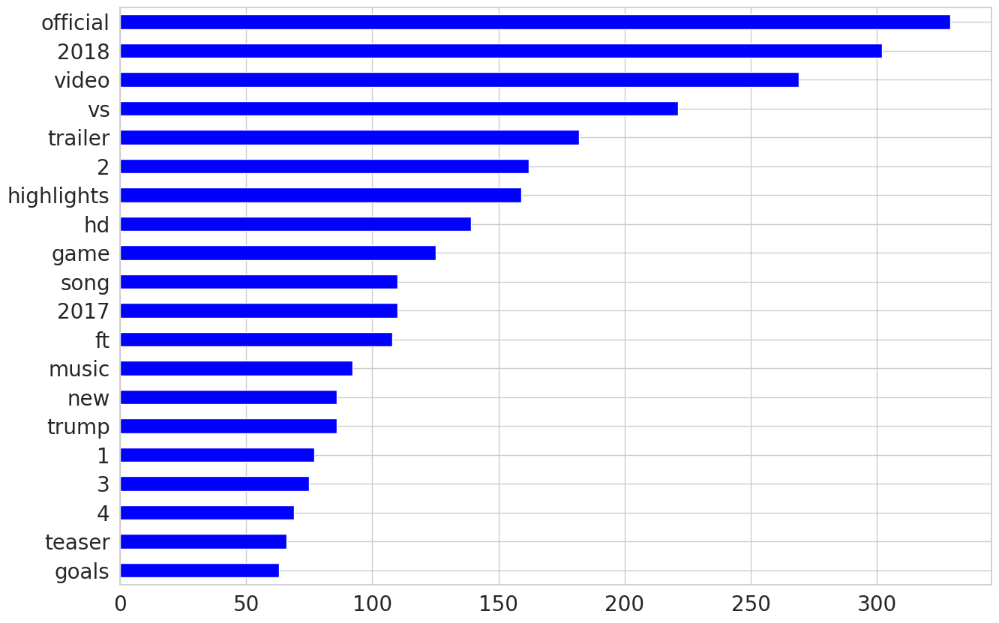

In [36]:
word_plot(popular_words,'blue')

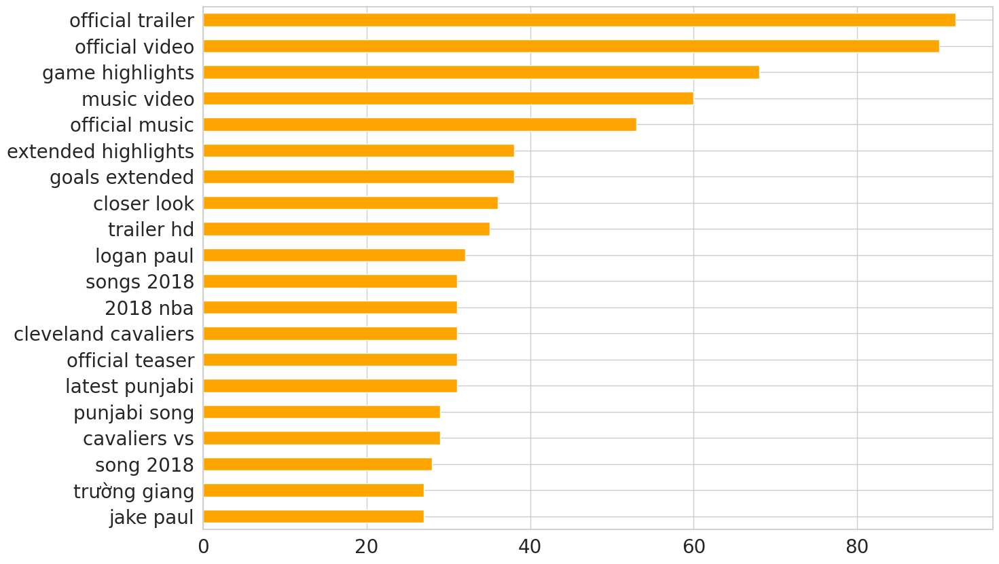

In [37]:
word_plot(popular_bigrams,'orange')

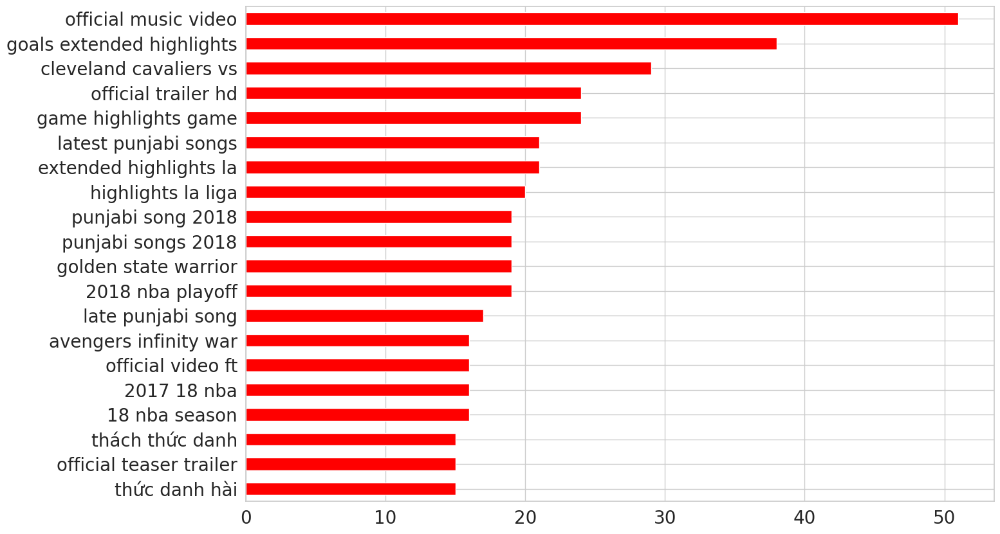

In [38]:
word_plot(popular_trigrams,'red')

#TfidfVectorizer
Tf-idf analyzes the impact of tokens (words) throughout the whole documents. For example, the more times a word appears in a document (each title), the more weight it will have. However, the more documents (titles) the word appears in, it is 'penalized' and the weight is diminished because it is empirically less informative than features that occur in a small fraction of the training corpus (source)

tf(t)= the term frequency is the number of times the term appears in the document
idf(d, t) = the document frequency is the number of documents 'd' that contain term 't'

In [39]:
"""word_vectorizer = TfidfVectorizer(
    sublinear_tf=True,
    strip_accents='unicode',
    analyzer='word',
    token_pattern=r'\w{1,}',
    stop_words='english',
    ngram_range=(1, 1),
    max_features=10000)
word_vectorizer.fit(df.title)
word_features = word_vectorizer.transform(df.title)

classifier_popular = LogisticRegression(C=0.1, solver='sag')
classifier_popular.fit(word_features ,df.popular)"""

"word_vectorizer = TfidfVectorizer(\n    sublinear_tf=True,\n    strip_accents='unicode',\n    analyzer='word',\n    token_pattern=r'\\w{1,}',\n    stop_words='english',\n    ngram_range=(1, 1),\n    max_features=10000)\nword_vectorizer.fit(df.title)\nword_features = word_vectorizer.transform(df.title)\n\nclassifier_popular = LogisticRegression(C=0.1, solver='sag')\nclassifier_popular.fit(word_features ,df.popular)"

In [40]:
x = df['title']
y = df['popular']

In [75]:

word_vectorizer = TfidfVectorizer(sublinear_tf=True,
    strip_accents='unicode',
    analyzer='word',
    token_pattern=r'\w{1,}',
    stop_words='english',
    ngram_range=(1, 1),
    max_features=10000)

#x = word_vectorizer.fit_transform(df.title)


word_vectorizer.fit(df.title)
word_features = word_vectorizer.transform(df.title)



In [76]:
x_train, x_test, y_train, y_test = train_test_split(word_features, df.popular, test_size = 0.3, random_state = 0, shuffle = True)

In [77]:
perform_list = [ ]

In [78]:
def run_model(model_name, est_c, est_pnlty):

    mdl = None

    if model_name == 'Logistic Regression':
        mdl = LogisticRegression()

    oneVsRest = OneVsRestClassifier(mdl)
    oneVsRest.fit(x_train, y_train)
    y_pred = oneVsRest.predict(x_test)

    accuracy = round(accuracy_score(y_test, y_pred) * 100, 2)

    # Get precision, recall, f1 scores
    precision, recall, f1score, support = score(y_test, y_pred, average='micro')

    print(f'Test Accuracy Score of Basic {model_name}: % {accuracy}')
    print(f'Precision: {precision}')
    print(f'Recall: {recall}')
    print(f'F1-score: {f1score}')

    # Confusion matrix
    cm = confusion_matrix(y_test, y_pred)

    # Create heatmap of confusion matrix
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, cmap='Blues', fmt='g')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title('Confusion Matrix')
    plt.show()

    # Add performance parameters to list
    perform_list.append({
        'Model': model_name,
        'Test Accuracy': round(accuracy, 2),
        'Precision': round(precision, 2),
        'Recall': round(recall, 2),
        'F1': round(f1score, 2)
    })

In [79]:
param_grid = {
    'penalty': ['l1', 'l2', 'elasticnet'],
    'C': [0.001, 0.01, 0.1, 1, 10]
}

# Initialize a LogisticRegression object
model_Logistic = LogisticRegression()

# Create a GridSearchCV object with 5-fold cross-validation
grid_search = GridSearchCV(model_Logistic, param_grid, cv=5)

# Fit the GridSearchCV object to the training data
grid_search.fit(x_train, y_train)

# Print the best hyperparameters found
print("Best hyperparameters found:")
print(grid_search.best_params_)

Best hyperparameters found:
{'C': 10, 'penalty': 'l2'}


Test Accuracy Score of Basic Logistic Regression: % 90.12
Precision: 0.901165347405453
Recall: 0.901165347405453
F1-score: 0.901165347405453


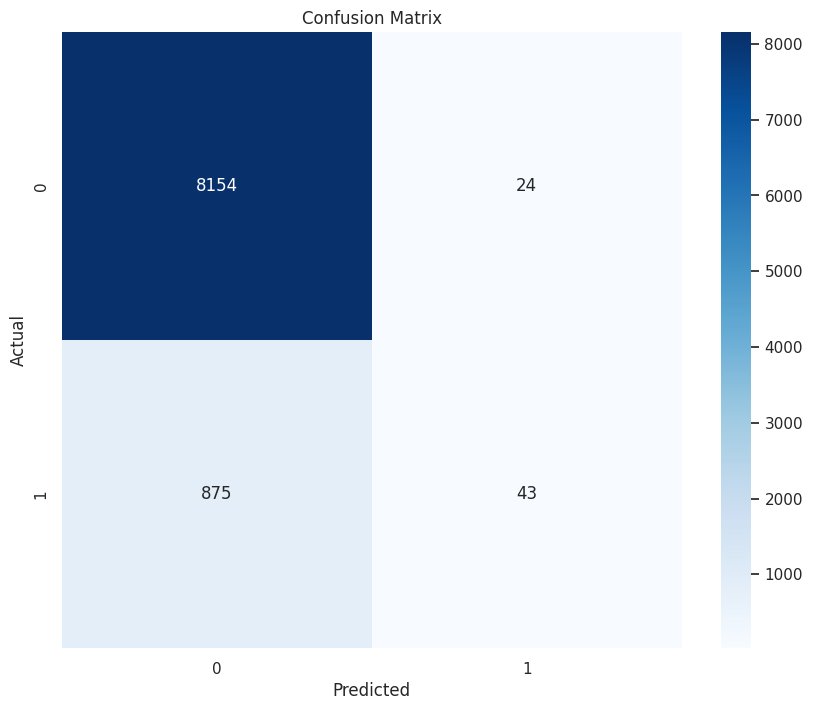

In [82]:
run_model('Logistic Regression', est_c=10, est_pnlty= 'l2')


In [83]:
classifier_popular = LogisticRegression(C=10, solver='sag')
classifier_popular.fit(word_features ,df.popular)

LogisticRegression(C=10, solver='sag')

In [51]:
"""from sklearn.metrics import confusion_matrix
predicted_classes = classifier_popular.predict(word_features)

# Compute confusion matrix
cm = confusion_matrix(df.popular, predicted_classes)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", linewidths=.5)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()"""

'from sklearn.metrics import confusion_matrix\npredicted_classes = classifier_popular.predict(word_features)\n\n# Compute confusion matrix\ncm = confusion_matrix(df.popular, predicted_classes)\n\n# Plot confusion matrix\nplt.figure(figsize=(8, 6))\nsns.heatmap(cm, annot=True, fmt="d", cmap="Blues", linewidths=.5)\nplt.title(\'Confusion Matrix\')\nplt.xlabel(\'Predicted\')\nplt.ylabel(\'Actual\')\nplt.show()'

In [84]:
names=['normal','popular']

In [85]:
c_tf = make_pipeline( word_vectorizer,classifier_popular)
explainer_tf = LimeTextExplainer(class_names=names)

exp = explainer_tf.explain_instance(df.title.iloc[10], c_tf.predict_proba, num_features=4, top_labels=1)
exp.show_in_notebook(text=df.title.iloc[10])

In [86]:
names = ['normal', 'popular']
c_tf = make_pipeline(word_vectorizer, classifier_popular)
explainer_tf = LimeTextExplainer(class_names=names)
exp = explainer_tf.explain_instance(df.title.iloc[10], c_tf.predict_proba, num_features=4, top_labels=1)
exp.show_in_notebook(text=df.title.iloc[10])


In [87]:
exp = explainer_tf.explain_instance(df.title.iloc[4], c_tf.predict_proba, num_features=5, top_labels=1)
exp.show_in_notebook(text=df.title.iloc[4])

In [88]:
exp = explainer_tf.explain_instance(df.title.iloc[10035], c_tf.predict_proba, num_features=5, top_labels=1)
exp.show_in_notebook(text=df.title.iloc[10035])

In [89]:

labels = list(df.category_names.value_counts().index.values)
values = list(df.category_names.value_counts().values)

trace = go.Pie(labels=labels, values=values)

iplot([trace], filename='basic_pie_chart')


In [90]:
df.groupby('category_names')['views'].describe()

,count,mean,std,min,25%,50%,75%,max
category_names,,,,,,,,
Autos & Vehicles,310.0,3.307246e+05,3.683403e+05,1858.0,84825.50,274928.0,487818.75,4361881.0
Comedy,2305.0,5.592607e+05,7.383105e+05,1295.0,147988.00,339863.0,681788.00,12924004.0
Education,763.0,2.949783e+05,5.621719e+05,773.0,92750.50,187226.0,331747.00,12100921.0
Entertainment,9730.0,4.727813e+05,1.095025e+06,733.0,95263.50,214571.0,463228.50,37736281.0
Film & Animation,1431.0,5.200164e+05,1.051451e+06,943.0,74924.50,169483.0,492721.00,15969920.0
Gaming,966.0,5.064342e+05,9.149512e+05,1237.0,127636.75,232512.5,540489.75,15919643.0
Howto & Style,1780.0,3.989963e+05,6.838055e+05,1107.0,66165.00,165509.5,432247.50,8307705.0
Movies,1.0,2.255280e+05,NaN,225528.0,225528.00,225528.0,225528.00,225528.0
Music,2479.0,1.282715e+06,3.355912e+06,1591.0,135294.50,372126.0,985582.00,48431654.0


In [91]:
entertainment_title= df["title"][(df['category_names'] == 'Entertainment')]
news_politics_title= df["title"][(df['category_names'] == 'News & Politics')]
people_title= df["title"][(df['category_names'] == 'People & Blogs')]
music_title= df["title"][(df['category_names'] == 'Music')]
sports_title= df["title"][(df['category_names'] == 'Sports')]
comedy_title= df["title"][(df['category_names'] == 'Comedy')]

In [99]:
from nltk.corpus import stopwords

In [106]:

entertainment_titles = df.loc[df['category_names'] == 'Entertainment', 'title']
english_tokenized_entertainment_titles = []

english_stopwords = set(stopwords.words("english"))

for title in entertainment_titles:

    tokens = nltk.word_tokenize(title)

    english_words = [word.lower() for word in tokens if word.isalpha() and len(word) > 1]
    english_tokenized_entertainment_titles.append(english_words)

gensim_dict = Dictionary(english_tokenized_entertainment_titles)
num_topics = 7
lda_popular_entertainment_title_vectorized = LdaModel(
    corpus=[gensim_dict.doc2bow(doc) for doc in english_tokenized_entertainment_titles],
    id2word=gensim_dict,
    num_topics=num_topics
)

vis_data = gensimvis.prepare(lda_popular_entertainment_title_vectorized,
                             [gensim_dict.doc2bow(doc) for doc in english_tokenized_entertainment_titles],
                             gensim_dict, n_jobs=1)

pyLDAvis.display(vis_data)


In [107]:


pyLDAvis.enable_notebook()


from nltk.corpus import stopwords
news_politics_title = df.loc[df['category_names'] == 'News & Politics', 'title']
english_tokenized_news_politics_title = []

english_stopwords = set(stopwords.words("english"))

for title in news_politics_title:

    tokens = nltk.word_tokenize(title)

    english_words = [word.lower() for word in tokens if word.isalpha() and len(word) > 1]
    english_tokenized_news_politics_title.append(english_words)

gensim_dict = Dictionary(english_tokenized_news_politics_title)
num_topics = 7
lda_popular_news_politics_title_vectorized = LdaModel(
    corpus=[gensim_dict.doc2bow(doc) for doc in english_tokenized_news_politics_title],
    id2word=gensim_dict,
    num_topics=num_topics
)

vis_data = gensimvis.prepare(lda_popular_news_politics_title_vectorized,
                             [gensim_dict.doc2bow(doc) for doc in english_tokenized_news_politics_title],
                             gensim_dict, n_jobs=1)

pyLDAvis.display(vis_data)



In [108]:
people_title = df.loc[df['category_names'] == 'People & Blogs', 'title']
english_tokenized_people_title = []

english_stopwords = set(stopwords.words("english"))

for title in people_title:

    tokens = nltk.word_tokenize(title)

    english_words = [word.lower() for word in tokens if word.isalpha() and len(word) > 1]
    english_tokenized_people_title.append(english_words)

gensim_dict = Dictionary(english_tokenized_people_title)
num_topics = 7
lda_popular_people_title_vectorized = LdaModel(
    corpus=[gensim_dict.doc2bow(doc) for doc in english_tokenized_people_title],
    id2word=gensim_dict,
    num_topics=num_topics
)

vis_data = gensimvis.prepare(lda_popular_people_title_vectorized,
                             [gensim_dict.doc2bow(doc) for doc in english_tokenized_people_title],
                             gensim_dict, n_jobs=1)

pyLDAvis.display(vis_data)


In [109]:
music_title = df.loc[df['category_names'] == 'Music', 'title']
english_tokenized_music_title = []

english_stopwords = set(stopwords.words("english"))

for title in music_title:

    tokens = nltk.word_tokenize(title)

    english_words = [word.lower() for word in tokens if word.isalpha() and len(word) > 1]
    english_tokenized_music_title.append(english_words)

gensim_dict = Dictionary(english_tokenized_music_title)
num_topics = 7
lda_popular_music_title_vectorized = LdaModel(
    corpus=[gensim_dict.doc2bow(doc) for doc in english_tokenized_music_title],
    id2word=gensim_dict,
    num_topics=num_topics
)

vis_data = gensimvis.prepare(lda_popular_music_title_vectorized,
                             [gensim_dict.doc2bow(doc) for doc in english_tokenized_music_title],
                             gensim_dict, n_jobs=1)

pyLDAvis.display(vis_data)

In [110]:
sports_title = df.loc[df['category_names'] == 'Sports', 'title']
english_tokenized_sports_title = []

english_stopwords = set(stopwords.words("english"))

for title in sports_title:

    tokens = nltk.word_tokenize(title)

    english_words = [word.lower() for word in tokens if word.isalpha() and len(word) > 1]
    english_tokenized_sports_title.append(english_words)

gensim_dict = Dictionary(english_tokenized_sports_title)
num_topics = 7
lda_popular_sports_title_vectorized = LdaModel(
    corpus=[gensim_dict.doc2bow(doc) for doc in english_tokenized_sports_title],
    id2word=gensim_dict,
    num_topics=num_topics
)

vis_data = gensimvis.prepare(lda_popular_sports_title_vectorized,
                             [gensim_dict.doc2bow(doc) for doc in english_tokenized_sports_title],
                             gensim_dict, n_jobs=1)

pyLDAvis.display(vis_data)

In [111]:
comedy_title = df.loc[df['category_names'] == 'Comedy', 'title']
english_tokenized_comedy_title = []

english_stopwords = set(stopwords.words("english"))

for title in comedy_title:

    tokens = nltk.word_tokenize(title)

    english_words = [word.lower() for word in tokens if word.isalpha() and len(word) > 1]
    english_tokenized_comedy_title.append(english_words)

gensim_dict = Dictionary(english_tokenized_comedy_title)
num_topics = 7
lda_popular_comedy_title_vectorized = LdaModel(
    corpus=[gensim_dict.doc2bow(doc) for doc in english_tokenized_comedy_title],
    id2word=gensim_dict,
    num_topics=num_topics
)

vis_data = gensimvis.prepare(lda_popular_comedy_title_vectorized,
                             [gensim_dict.doc2bow(doc) for doc in english_tokenized_comedy_title],
                             gensim_dict, n_jobs=1)

pyLDAvis.display(vis_data)

## **7**. Modeling <a class="anchor" id="Model"></a>
## Generating titles by lstm

In [112]:
tokenizer = Tokenizer()

def get_sequence_of_tokens(corpus):
    ## tokenization
    tokenizer.fit_on_texts(corpus)
    total_words = len(tokenizer.word_index) + 1

    ## convert data to sequence of tokens
    input_sequences = []
    for line in corpus:
        token_list = tokenizer.texts_to_sequences([line])[0]
        for i in range(1, len(token_list)):
            n_gram_sequence = token_list[:i+1]
            input_sequences.append(n_gram_sequence)
    return input_sequences, total_words

inp_sequences, total_words = get_sequence_of_tokens(popular)
inp_sequences[:10]

[[15, 2776],
 [15, 2776, 45],
 [15, 2776, 45, 702],
 [15, 2776, 45, 702, 90],
 [15, 2776, 45, 702, 90, 362],
 [15, 2776, 45, 702, 90, 362, 408],
 [929, 573],
 [929, 573, 271],
 [929, 573, 271, 409],
 [929, 573, 271, 409, 121]]

In [113]:
def generate_padded_sequences(input_sequences):
    max_sequence_len = max([len(x) for x in input_sequences])
    input_sequences = np.array(pad_sequences(input_sequences, maxlen=max_sequence_len, padding='pre'))

    predictors, label = input_sequences[:,:-1],input_sequences[:,-1]
    label = ku.to_categorical(label, num_classes=total_words)
    return predictors, label, max_sequence_len

predictors, label, max_sequence_len = generate_padded_sequences(inp_sequences)

In [114]:
def create_model(max_sequence_len, total_words):
    input_len = max_sequence_len - 1
    model = Sequential()

    # Add Input Embedding Layer
    model.add(Embedding(total_words, 10, input_length=input_len))

    # Add Hidden Layer 1 - LSTM Layer
    model.add(LSTM(100))
    model.add(Dropout(0.1))

    # Add Output Layer
    model.add(Dense(total_words, activation='softmax'))

    model.compile(loss='categorical_crossentropy', optimizer='adam')

    return model

model = create_model(max_sequence_len, total_words)
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 23, 10)            71700     
                                                                 
 lstm (LSTM)                 (None, 100)               44400     
                                                                 
 dropout (Dropout)           (None, 100)               0         
                                                                 
 dense (Dense)               (None, 7170)              724170    
                                                                 
Total params: 840,270
Trainable params: 840,270
Non-trainable params: 0
_________________________________________________________________


In [115]:
model.fit(predictors, label, epochs=20, verbose=5)

Epoch 1/20
Epoch 2/20
Epoch 3/20
Epoch 4/20
Epoch 5/20
Epoch 6/20
Epoch 7/20
Epoch 8/20
Epoch 9/20
Epoch 10/20
Epoch 11/20
Epoch 12/20
Epoch 13/20
Epoch 14/20
Epoch 15/20
Epoch 16/20
Epoch 17/20
Epoch 18/20
Epoch 19/20
Epoch 20/20


In [116]:
import numpy as np

def generate_text(seed_text, next_words, model, max_sequence_len, tokenizer):
    for _ in range(next_words):
        token_list = tokenizer.texts_to_sequences([seed_text])[0]
        token_list = pad_sequences([token_list], maxlen=max_sequence_len-1, padding='pre')
        predicted_probs = model.predict(token_list, verbose=0)
        predicted_class_index = np.argmax(predicted_probs)

        output_word = ""
        for word, index in tokenizer.word_index.items():
            if index == predicted_class_index:
                output_word = word
                break
        seed_text += " " + output_word
    return seed_text.title()

## 8. Generating the Results <a class="anchor" id="Result"></a>

In [117]:
print(generate_text("Marvel", 3, model, max_sequence_len, tokenizer))
print(generate_text("Iron Man", 2, model, max_sequence_len, tokenizer))
print(generate_text("united states", 3, model, max_sequence_len, tokenizer))
print(generate_text("laugh", 5, model, max_sequence_len, tokenizer))
print(generate_text("Golden", 5, model, max_sequence_len, tokenizer))
print(generate_text("National", 5, model, max_sequence_len, tokenizer))
print(generate_text("Music", 3, model, max_sequence_len, tokenizer))
print(generate_text("highlights", 6, model, max_sequence_len, tokenizer))

Marvel Studios Avengers Infinity
Iron Man Shaker Official
United States Vs Bangladesh Nfl
Laugh Eazy Halsey Official Video Ft
Golden State Warrior Vs Houston Rockets
National 2 2 Race 2018 2018
Music Vs Barcelona 2
Highlights X New Motion Slow Mo Guy
